In [2]:
# import required packages
import time
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
from scipy.integrate import odeint

# import MAGI-X packages
from scripts.magix.dynamic import nnSTModule, nnMTModule # neural network module
from scripts.magix.inference import FMAGI # inferred module

### Hes1

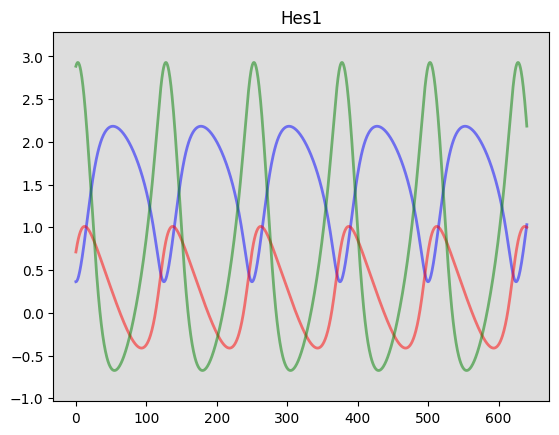

In [3]:
# define Hes1 model dynamic
def fOde(y, t, a, b, c, d, e, f, g):
	P, M, H = y
	dPdt = -a*P*H + b*M - c*P
	dMdt = -d*M + e/(1+np.power(P,2))
	dHdt = -a*P*H + f/(1+np.power(P,2)) - g*H
	return (dPdt,dMdt,dHdt)

# model parameters
a, b, c, d, e, f, g = 0.022, 0.3, 0.031, 0.028, 0.5, 20, 0.3
# initial condition
P0, M0, R0 = 1.438575, 2.037488, 17.90385
y0 = P0, M0, R0
# time point for evaluation
tdata = np.linspace(0, 640, 1281)
# integration 
xdata = odeint(fOde, y0, tdata, args = (a,b,c,d,e,f,g))
xdata = np.log(xdata)

fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111, facecolor='#dddddd', axisbelow=True)
ax.plot(tdata, xdata[:,0], 'b', alpha=0.5, lw=2, label='P')
ax.plot(tdata, xdata[:,1], 'r', alpha=0.5, lw=2, label='M')
ax.plot(tdata, xdata[:,2], 'g', alpha=0.5, lw=2, label='H')
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(np.min(xdata)-0.1*np.ptp(xdata),np.max(xdata)+0.1*np.ptp(xdata))
plt.title('Hes1')
plt.show()

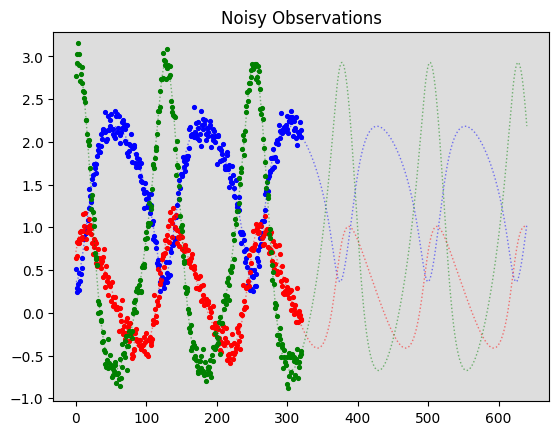

In [4]:
# setting
seed = 188714368 # random seed
noise = [0.10,0.10,0.10] # noise level
no_train = 321 # number of training samples 41/81/161/321/641/1281

# observation
obs = []
no_comp = xdata.shape[1] # number of components
obs_idx = np.linspace(0,int((tdata.size-1)/2),no_train).astype(int)
np.random.seed(seed) # set random seed for noise
for i in range(no_comp):
    tobs = tdata[obs_idx].copy()
    yobs = xdata[obs_idx,i].copy() + np.random.normal(0,noise[i],no_train)
    obs.append(np.hstack((tobs.reshape(-1,1),yobs.reshape(-1,1))))
    
# visualize the groundtruth trajectory and the noisy data
col = ['b','r','g']
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111, facecolor='#dddddd', axisbelow=True)
for i in range(no_comp):
    ax.plot(tdata, xdata[:,i], color=col[i], linestyle=':', alpha=0.5, lw=1)
    ax.scatter(obs[i][:,0], obs[i][:,1], s=7.5, marker='o', color=col[i])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(np.min(xdata)-0.1*np.ptp(xdata),np.max(xdata)+0.1*np.ptp(xdata))
plt.title('Noisy Observations')
plt.show()

In [5]:
# MAP Inference - Single Task Neural Network
torch.manual_seed(seed)
# define neural network dynamic
fOde = nnMTModule(no_comp, [512], dp=0) # dp for dropout probability
# time recording
start_time = time.time()
# call inference class

from scripts.magix.inference_archive import FMAGI 
model = FMAGI(obs,fOde,grid_size=161,interpolation_orders=3) 
# map inference
tinfer, xinfer = model.map(max_epoch=1000,
                    learning_rate=1e-3, decay_learning_rate=False,
                    hyperparams_update=False, dynamic_standardization=True,
                    kappa=0, verbose=True, returnX=True)
end_time = time.time()
run_time = end_time - start_time
print("run time: %.2f seconds" %(run_time))

/mnt/home/sykim/.conda/envs/py39/lib/python3.9/site-packages/linear_operator/utils/interpolation.py:71: UserWarning: torch.sparse.SparseTensor(indices, values, shape, *, device=) is deprecated.  Please use torch.sparse_coo_tensor(indices, values, shape, dtype=, device=). (Triggered internally at /opt/conda/conda-bld/pytorch_1729647380992/work/torch/csrc/utils/tensor_new.cpp:651.)
  summing_matrix = cls(summing_matrix_indices, summing_matrix_values, size)
/mnt/home/sykim/.conda/envs/py39/lib/python3.9/site-packages/linear_operator/utils/sparse.py:51: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if nonzero_indices.storage():


1/1000 iteration: 10.348901
200/1000 iteration: 5.355932
400/1000 iteration: 4.250740
600/1000 iteration: 3.880906
800/1000 iteration: 3.737221
1000/1000 iteration: 3.670727
run time: 32.72 seconds


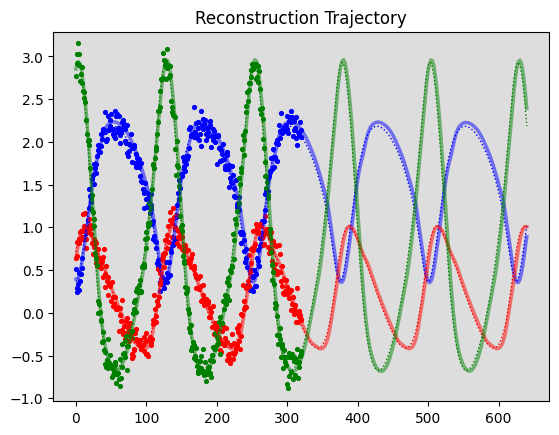

In [6]:
# reconstruction 
trecon = tdata[np.linspace(0,tdata.size-1,321).astype(int)]
x0 = xinfer[0,:].squeeze() # inferred initial state
tr, xr = model.predict(trecon[1:],trecon[:1],x0,random=False) # reconstructed trajectory
# visualization
col = ['b','r','g','m','y']
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111, facecolor='#dddddd', axisbelow=True)
for i in range(no_comp):
    ax.plot(tr, xr[:,i], color=col[i], alpha=0.5, lw=2.5)
    ax.plot(tdata, xdata[:,i], linestyle=':', color=col[i], alpha=1, lw=1)
    ax.scatter(obs[i][:,0], obs[i][:,1], s=7.5, marker='o', color=col[i])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(np.min(xdata)-0.1*np.ptp(xdata),np.max(xdata)+0.1*np.ptp(xdata))
plt.title('Reconstruction Trajectory')
plt.show()

In [7]:
# MAP Inference - Single Task Neural Network
torch.manual_seed(seed)
# define neural network dynamic
fOde = nnSTModule(no_comp, [512], dp=0) # dp for dropout probability
# time recording
start_time = time.time()
# call inference class
model = FMAGI(obs,fOde,grid_size=161,interpolation_orders=3) 
# map inference
tinfer, xinfer = model.map(max_epoch=1000,
                    learning_rate=1e-3, decay_learning_rate=False,
                    hyperparams_update=False, dynamic_standardization=True,
                    kappa=0, verbose=True, returnX=True)
end_time = time.time()
run_time = end_time - start_time
print("run time: %.2f seconds" %(run_time))

1/1000 iteration: 10.154749
200/1000 iteration: 5.288609
400/1000 iteration: 4.224643
600/1000 iteration: 3.860401
800/1000 iteration: 3.720408
1000/1000 iteration: 3.654091
run time: 44.47 seconds


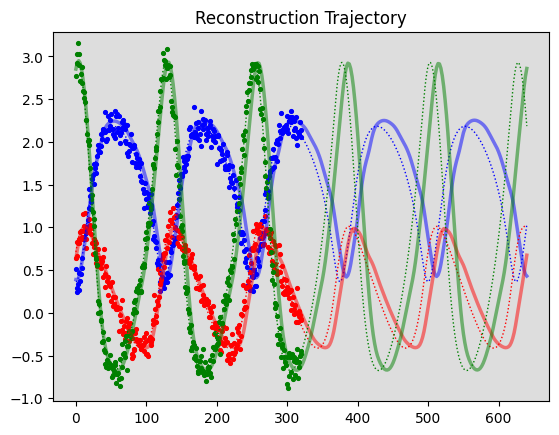

In [12]:
# reconstruction 
trecon = tdata[np.linspace(0,tdata.size-1,321).astype(int)]
x0 = xinfer[0,:].squeeze() # inferred initial state
tr, xr = model.predict(trecon[1:],trecon[:1],x0,random=False) # reconstructed trajectory
# visualization
col = ['b','r','g','m','y']
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111, facecolor='#dddddd', axisbelow=True)
for i in range(no_comp):
    ax.plot(tr, xr[:,i], color=col[i], alpha=0.5, lw=2.5)
    ax.plot(tdata, xdata[:,i], linestyle=':', color=col[i], alpha=1, lw=1)
    ax.scatter(obs[i][:,0], obs[i][:,1], s=7.5, marker='o', color=col[i])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(np.min(xdata)-0.1*np.ptp(xdata),np.max(xdata)+0.1*np.ptp(xdata))
plt.title('Reconstruction Trajectory')
plt.show()

In [45]:
import numpy as np
import torch
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Define the true Hes1 dynamics function
def hes1_derivative(state, params):
    P, M, H = state
    a, b, c, d, e, f, g = params
    dP = -a * P * H + b * M - c * P
    dM = -d * M + e / (1 + P**2)
    dH = -a * P * H + f / (1 + P**2) - g * H
    return np.array([dP, dM, dH])

# 2. Compute a 3D vector field on a grid
def compute_vector_field_3d(model, grid_bounds, resolution=15):
    pmin, pmax, mmin, mmax, hmin, hmax = grid_bounds
    P = np.linspace(pmin, pmax, resolution)
    M = np.linspace(mmin, mmax, resolution)
    H = np.linspace(hmin, hmax, resolution)
    Pg, Mg, Hg = np.meshgrid(P, M, H, indexing='ij')
    U = np.zeros_like(Pg)
    V = np.zeros_like(Pg)
    W = np.zeros_like(Pg)
    for idx in np.ndindex(Pg.shape):
        inp = torch.tensor([Pg[idx], Mg[idx], Hg[idx]], dtype=torch.float64)
        with torch.no_grad():
            deriv = model(inp).numpy().flatten()
        U[idx], V[idx], W[idx] = deriv
    return Pg, Mg, Hg, U, V, W

# 3. Generate analytic nullcline surfaces
def analytic_nullclines(params, grid_bounds, resolution=50):
    a, b, c, d, e, f, g = params
    P = np.linspace(grid_bounds[0], grid_bounds[1], resolution)
    H = np.linspace(grid_bounds[4], grid_bounds[5], resolution)
    P2, H2 = np.meshgrid(P, H, indexing='ij')
    # P-nullcline: dP=0 => -a*P*H + b*M - c*P = 0 => M = (a*P*H + c*P)/b
    M_pnull = (a * P2 * H2 + c * P2) / b
    # M-nullcline: dM=0 => -d*M + e/(1+P^2) = 0 => M = e/(d*(1+P^2))
    M_mnull = e / (d * (1 + P2**2))
    # H-nullcline: dH=0 => -a*P*H + f/(1+P^2) - g*H = 0 => H*(a*P + g) = f/(1+P^2)
    H_hnull = f / ((1 + P2**2) * (a * P2 + g))
    return (P2, H2, M_pnull), (P2, H2, M_mnull), (P, np.zeros_like(P), np.zeros_like(P))  # simplified placeholder

# 4. Plot comparison using Plotly
def plot_3d_comparison(true_vf, single_vf, multi_vf, single_pts, multi_pts, grid_bounds):
    fig = make_subplots(rows=1, cols=3,
                        specs=[[{'type': 'scene'}, {'type': 'scene'}, {'type': 'scene'}]],
                        subplot_titles=("True Vector Field", "Single-Start Estimate", "Multi-Start Estimate"))
    
    # Helper to add traces
    def add_traces(scene, vf, pts, include_true=False):
        Pg, Mg, Hg, U, V, W = vf
        fig.add_trace(go.Cone(x=Pg.flatten(), y=Mg.flatten(), z=Hg.flatten(),
                              u=U.flatten(), v=V.flatten(), w=W.flatten(),
                              sizemode='scaled', sizeref=0.8, anchor='tail',
                              showscale=False), row=1, col=scene)
        if pts is not None:
            fig.add_trace(go.Scatter3d(x=pts[:,0], y=pts[:,1], z=pts[:,2],
                                       mode='markers', marker=dict(size=3, color='black'),
                                       name='Training Data'), row=1, col=scene)
        if include_true:
            # Analytic nullclines as surfaces
            pnull, mnull, hnull = analytic_nullclines(params, grid_bounds)
            P2, H2, M_p = pnull
            fig.add_trace(go.Surface(x=P2, y=M_p, z=H2, opacity=0.5, colorscale='Reds', showscale=False, name='P-null'), row=1, col=scene)
            fig.add_trace(go.Surface(x=P2, y=M_p, z=H2, opacity=0.5, colorscale='Greens', showscale=False, name='M-null'), row=1, col=scene)
    
    params = (0.022, 0.3, 0.031, 0.028, 0.5, 20.0, 0.3)
    
    add_traces(1, true_vf, None, include_true=True)
    add_traces(2, single_vf, single_pts)
    add_traces(3, multi_vf, multi_pts)
    
    # Update layout
    for i in range(1,4):
        fig['layout'][f'scene{i}'].update(xaxis_title='P', yaxis_title='M', zaxis_title='H',
                                         xaxis=dict(range=[grid_bounds[0], grid_bounds[1]]),
                                         yaxis=dict(range=[grid_bounds[2], grid_bounds[3]]),
                                         zaxis=dict(range=[grid_bounds[4], grid_bounds[5]]))
    fig.update_layout(height=600, width=1800, title_text="3D Vector Field Comparison for Hes1")
    fig.show()

# Usage example:
# Assuming `single_model` and `multi_model` are trained torch models,
# and `single_states`, `multi_states` are your training data tensors of shape (N,3).

# Define grid bounds for P, M, H
# grid_bounds = (-1.0, 3.0, 0.0, 4.0, 0.0, 20.0)

# # Compute vector fields
# true_vf = compute_vector_field_3d(lambda x: torch.tensor(hes1_derivative(x.numpy(), params)), grid_bounds)
# single_vf = compute_vector_field_3d(single_model, grid_bounds)
# multi_vf  = compute_vector_field_3d(multi_model, grid_bounds)

# # Convert training data to numpy
# single_pts = single_states.numpy()
# multi_pts  = multi_states.numpy()

# # Plot the comparison
# plot_3d_comparison(true_vf, single_vf, multi_vf, single_pts, multi_pts, grid_bounds)


In [46]:
import numpy as np
import torch
import time
from scipy.integrate import odeint
from scripts.magix.dynamic import nnSTModule, nnMTModule
from scripts.magix.inference_archive import FMAGI
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Hes1 ODE definition
def fOde(y, t, a, b, c, d, e, f, g):
    P, M, H = y
    return np.array([
        -a * P * H + b * M - c * P,
        -d * M + e / (1 + P**2),
        -a * P * H + f / (1 + P**2) - g * H
    ])

# parameters
a, b, c, d, e, f, g = 0.022, 0.3, 0.031, 0.028, 0.5, 20.0, 0.3

# 2. Simulate true trajectory in original space, then log-transform
P0, M0, H0 = 1.438575, 2.037488, 17.90385
tdata = np.linspace(0, 640, 1281)
traj = odeint(fOde, (P0, M0, H0), tdata, args=(a,b,c,d,e,f,g))
if np.any(traj <= 0):
    raise RuntimeError("Trajectory has non-positive values; check parameters.")
xdata = np.log(traj)

# 3. Build noisy single-start observations (log-space)
seed = 188714368
np.random.seed(seed)
noise = [0.1, 0.1, 0.1]
no_train = 321
idxs = np.linspace(0, (tdata.size-1)//2, no_train).astype(int)
obs = []
for i in range(3):
    tt = tdata[idxs]
    yy = xdata[idxs, i] + np.random.normal(0, noise[i], no_train)
    obs.append(np.vstack((tt, yy)).T)

# 4. Single-start MAGI-X inference on log-space
torch.manual_seed(seed)
fOde_st = nnSTModule(3, [512], dp=0)
magi = FMAGI(obs, fOde_st, grid_size=161, interpolation_orders=3)
start = time.time()
_, xin = magi.map(
    max_epoch=1000,
    learning_rate=1e-3,
    decay_learning_rate=False,
    hyperparams_update=False,
    dynamic_standardization=True,
    kappa=0,
    verbose=True,
    returnX=True
)
print("MAGI-X single-start runtime: %.2f s" % (time.time() - start))
single_net = magi.fOde  # this NN approximates d(log y)/dt

# 5. Multi-start custom NN on log-space with positive starts
# sample 5 perturbed log-starts around (log P0, log M0, log H0)
z0 = np.log([P0, M0, H0])
perturbs = np.random.normal(scale=0.1, size=(5,3))
z_starts = z0 + perturbs
y_starts = np.exp(z_starts)

def compute_log_states_derivs(y0):
    """Integrate ODE from y0, return (log-states, dlog-states/dt)"""
    tr = odeint(fOde, y0, tdata, args=(a,b,c,d,e,f,g))
    if np.any(tr <= 0):
        raise RuntimeError("Negative values encountered for start %s" % (y0,))
    ztraj = np.log(tr)
    dz = np.array([fOde(tr[i], 0, a,b,c,d,e,f,g) / tr[i] for i in range(len(tr))])
    return torch.tensor(ztraj, dtype=torch.float64), torch.tensor(dz, dtype=torch.float64)

# collect all states/derivs
S_list, D_list = [], []
for y0 in y_starts:
    S, D = compute_log_states_derivs(y0)
    S_list.append(S); D_list.append(D)
S_multi = torch.cat(S_list)
D_multi = torch.cat(D_list)

# train NN on (log-states -> dlog/dt)
def train_nn(states, derivs, hidden=512, epochs=1000):
    net = nnMTModule(3, [hidden], dp=0)
    m, s = torch.mean(derivs,0), torch.std(derivs,0)
    net.update_output_layer(m, s)
    opt = torch.optim.Adam(net.parameters(), lr=1e-3)
    for _ in range(epochs):
        opt.zero_grad()
        loss = torch.mean((net(states) - derivs)**2)
        loss.backward(); opt.step()
    return net

torch.manual_seed(seed)
mt_net = train_nn(S_multi, D_multi)

# 6. True-model wrapper mapping log-state -> dlog/dt
def true_model(z: torch.Tensor):
    y = torch.exp(z)              # back to original space
    dydt = torch.tensor(fOde(y.numpy(),0,a,b,c,d,e,f,g),
                       dtype=torch.float64)
    return dydt / y               # chain rule: d(log y)/dt = y'/y

# 7. Sample 3×3×3 vector field (log-space)

def compute_vf(model, bounds, res=15):
    p0,p1,m0,m1,h0,h1 = bounds
    Ps = np.linspace(p0,p1,res)
    Ms = np.linspace(m0,m1,res)
    Hs = np.linspace(h0,h1,res)
    Pg,Mg,Hg = np.meshgrid(Ps,Ms,Hs, indexing='ij')
    U = np.zeros_like(Pg)
    V = np.zeros_like(Pg)
    W = np.zeros_like(Pg)

    for idx in np.ndindex(Pg.shape):
        z = torch.tensor([Pg[idx], Mg[idx], Hg[idx]], dtype=torch.float64)
        with torch.no_grad():
            d = model(z).numpy().flatten()
        U[idx], V[idx], W[idx] = d
    print(U.min(), U.max())

    return Pg, Mg, Hg, U, V, W

bounds = (-1.0,3.0, 0.0,4.0, 0.0,20.0)
vf_true   = compute_vf(true_model,   bounds, res=15)
vf_single = compute_vf(single_net,   bounds, res=15)
vf_multi  = compute_vf(mt_net,       bounds, res=15)



# 8. Nullclines (in P-M plane at various H)

def nullclines(bounds, res=20):
    p0,p1,_,_,h0,h1 = bounds
    Ps = np.linspace(p0,p1,res)
    Hs = np.linspace(h0,h1,res)
    P2,H2 = np.meshgrid(Ps,Hs,indexing='ij')
    Vn = (a*P2*H2 + c*P2)/b  # V-nullcline: dP/dt=0 => -aPH + bM - cP = 0 => M=...
    Mn = e/(d*(1+P2**2))     # M-nullcline: -dM + e/(1+P^2)=0 => M=...
    return (P2,H2,Vn),(P2,H2,Mn)
def add_nullclines(fig, col, vf, analytic=False):
    Pg, Mg, Hg, U, V, W = vf
    if analytic:
        # use your original analytic formulas
        (P2,H2,Vn),(P2b,H2b,Mn) = nullclines(bounds)
        fig.add_trace(go.Surface(
            x=P2, y=Vn, z=H2,
            opacity=0.4, colorscale='Reds', showscale=False
        ), row=1, col=col)
        fig.add_trace(go.Surface(
            x=P2b, y=Mn, z=H2b,
            opacity=0.4, colorscale='Greens', showscale=False
        ), row=1, col=col)
    else:
        # estimated: draw U=0 isosurface (dP/dt=0) in red, V=0 (dM/dt=0) in green
        tolU = np.max(np.abs(U)) * 0.05
        tolV = np.max(np.abs(V)) * 0.05

        fig.add_trace(go.Isosurface(
            x=Pg.flatten(), y=Mg.flatten(), z=Hg.flatten(),
            value=U.flatten(),
            isomin=-tolU, isomax=tolU, surface_count=1,
            caps=dict(x_show=False,y_show=False,z_show=False),
            opacity=0.5, colorscale='Reds', showscale=False
        ), row=1, col=col)
        fig.add_trace(go.Isosurface(
            x=Pg.flatten(), y=Mg.flatten(), z=Hg.flatten(),
            value=V.flatten(),
            isomin=-tolV, isomax=tolV, surface_count=1,
            caps=dict(x_show=False,y_show=False,z_show=False),
            opacity=0.5, colorscale='Greens', showscale=False
        ), row=1, col=col)
# observation cloud in log-space
pts = np.column_stack([obs[i][:,1] for i in range(3)])

# 9. Plotly 3-panel
fig = make_subplots(rows=1,cols=3,
    specs=[[{'type':'scene'}]*3],
    subplot_titles=("True","Single-Start","Multi-Start")
)
def add_panel(col, vf, analytic_null):
    
    Pg,Mg,Hg,U,V,W = vf
    fig.add_trace(go.Cone(
        x=Pg.flatten(), y=Mg.flatten(), z=Hg.flatten(),
        u=U.flatten(), v=V.flatten(), w=W.flatten(),
        sizemode='scaled', sizeref=0.8, anchor='tail',
        showscale=(col==3)
    ), row=1, col=col)
    fig.add_trace(go.Scatter3d(
        x=pts[:,0], y=pts[:,1], z=pts[:,2],
        mode='markers', marker=dict(size=3,color='black'),
        showlegend=False
    ), row=1, col=col)
     # add nullclines: analytic on panel 1, estimated on 2,3
    add_nullclines(fig, col, vf, analytic=analytic_null)
    
    # if show_null:
    #     (P2,H2,Vn),(P2b,H2b,Mn) = nullclines(bounds)
    #     fig.add_trace(go.Surface(
    #         x=P2, y=Vn, z=H2,
    #         opacity=0.4, colorscale='Reds', showscale=False
    #     ), row=1, col=col)
    #     fig.add_trace(go.Surface(
    #         x=P2b, y=Mn, z=H2b,
    #         opacity=0.4, colorscale='Greens', showscale=False
    #     ), row=1, col=col)

add_panel(1, vf_true,  True)
add_panel(2, vf_single, False)
add_panel(3, vf_multi,  False)

for i in range(1,4):
    fig.update_layout({f'scene{i}': dict(
        xaxis=dict(title='log P', range=bounds[0:2]),
        yaxis=dict(title='log M', range=bounds[2:4]),
        zaxis=dict(title='log H', range=bounds[4:6])
    )})
fig.update_layout(height=600, width=1800,
                  title="3D Hes1 Vector Fields (log-space): True vs Single vs Multi")
fig.show()



1/1000 iteration: 10.154749
200/1000 iteration: 5.288609
400/1000 iteration: 4.224643
600/1000 iteration: 3.860401
800/1000 iteration: 3.720408
1000/1000 iteration: 3.654091
MAGI-X single-start runtime: 37.63 s
-10673634.315079264 44.470947730772984
-0.543403522431726 0.47911483210378064
-0.7540091615713278 0.545305147651195


In [53]:
import numpy as np
import torch
import time
from scipy.integrate import odeint
from scripts.magix.dynamic import nnSTModule, nnMTModule
from scripts.magix.inference_archive import FMAGI
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Hes1 ODE in original P,M,H
def fOde(y, t, a, b, c, d, e, f, g):
    P,M,H = y
    return np.array([
      -a*P*H + b*M - c*P,       # dP/dt
      -d*M + e/(1+P**2),        # dM/dt
      -a*P*H + f/(1+P**2) - g*H # dH/dt
    ])

# 2. parameters + ground-truth simulation
a,b,c,d,e,f,g = 0.022,0.3,0.031,0.028,0.5,20.0,0.3
P0,M0,H0 = 1.438575,2.037488,17.90385
tdata = np.linspace(0,640,1281)
traj = odeint(fOde, (P0,M0,H0), tdata, args=(a,b,c,d,e,f,g))

# 3. build noisy single-start obs in original space
seed = 188714368
np.random.seed(seed)
noise = [0.1,0.1,0.1]
no_train = 321
idxs = np.linspace(0,(tdata.size-1)//2,no_train).astype(int)
obs = []
for i in range(3):
    tt = tdata[idxs]
    yy = traj[idxs,i] + np.random.normal(0,noise[i],no_train)
    obs.append(np.column_stack((tt,yy)))

# 4. MAGI-X on original P,M,H
torch.manual_seed(seed)
fOde_st = nnSTModule(3, [512], dp=0)
magi     = FMAGI(obs, fOde_st, grid_size=161, interpolation_orders=3)
start = time.time()
tinfer, xinfer = magi.map(
    max_epoch=1000,
    learning_rate=1e-3,
    decay_learning_rate=False,
    hyperparams_update=False,
    dynamic_standardization=True,
    verbose=True,
    returnX=True
)
print("single‐start MAGI-X runtime: %.2f s"%(time.time()-start))
single_net = magi.fOde     # now approximates d[P,M,H]/dt directly

# 5. build multi‐start training set in original space
#    (same five perturbed starts but never log/exp)
z0 = np.array([P0,M0,H0])
perturbs = np.random.normal(scale=0.1, size=(5,3))
starts = z0[None] + perturbs
# S_list,D_list = [],[]
# for y0 in starts:
#     T = tdata
#     X = odeint(fOde, y0, T, args=(a,b,c,d,e,f,g))
#     S_list.append(torch.tensor(X, dtype=torch.float64))
#     D = np.stack([fOde(X[j],0,a,b,c,d,e,f,g) for j in range(len(T))])
#     D_list.append(torch.tensor(D, dtype=torch.float64))
# S_multi = torch.cat(S_list)
# D_multi = torch.cat(D_list)

# def train_nn(states, derivs, hidden=512, epochs=1000):
#     net = nnMTModule(3, [hidden], dp=0)
#     m,s = torch.mean(derivs,0), torch.std(derivs,0)
#     net.update_output_layer(m,s)
#     opt = torch.optim.Adam(net.parameters(), lr=1e-3)
#     for _ in range(epochs):
#         opt.zero_grad()
#         loss = torch.mean((net(states)-derivs)**2)
#         loss.backward()
#         opt.step()
#     return net

# torch.manual_seed(seed)
# mt_net = train_nn(S_multi, D_multi)
# Example: let’s just re-use your five perturbed trajectories:
# assume starts is a list of initial y0’s
all_obs = [ [] for _ in range(3) ]
for y0 in starts:
    tr = odeint(fOde, y0, tdata, args=(a,b,c,d,e,f,g))
    # add noise, pick your sample indices idxs
    for d in range(3):
        tt = tdata[idxs]
        yy = tr[idxs,d] + np.random.normal(0,noise[d],len(idxs))
        all_obs[d].append( np.vstack((tt,yy)).T )

# now each all_obs[d] is a list of arrays, one per start
# concatenate them:
obs_list = [ np.vstack(segments) for segments in all_obs ]

# now run FMAGI exactly as before:
fOde_mt = nnMTModule(3, [512], dp=0)
magi_mt = FMAGI(obs_list, fOde_mt, grid_size=161, interpolation_orders=3)

start = time.time()
tinfer_mt, xin_multi = magi_mt.map(
    max_epoch=1000,
    learning_rate=1e-3,
    decay_learning_rate=False,
    hyperparams_update=False,
    dynamic_standardization=True,
    kappa=0,
    verbose=True,
    returnX=True
)
print("MAGI-X multi-start runtime:", time.time()-start)

mt_net = magi_mt.fOde   # <— this is your multi-start network

# 6. vector‐field sampler in original P,M,H
def compute_vf(model, bounds, res=15):
    p0,p1,m0,m1,h0,h1 = bounds
    Ps = np.linspace(p0,p1,res)
    Ms = np.linspace(m0,m1,res)
    Hs = np.linspace(h0,h1,res)
    Pg,Mg,Hg = np.meshgrid(Ps,Ms,Hs,indexing='ij')
    U = np.zeros_like(Pg)
    V = np.zeros_like(Pg)
    W = np.zeros_like(Pg)

    for idx in np.ndindex(Pg.shape):
        x = torch.tensor([Pg[idx],Mg[idx],Hg[idx]],dtype=torch.float64)
        with torch.no_grad():
            d = model(x).numpy().flatten()
        U[idx],V[idx],W[idx] = d
    print("field range dP:",U.min(),U.max())
    return Pg,Mg,Hg,U,V,W

bounds = (-1.0,3.0, 0.0,4.0, 0.0,20.0)
vf_true   = compute_vf(lambda z: torch.tensor(fOde(z.numpy(),0,a,b,c,d,e,f,g),dtype=torch.float64), bounds)
vf_single = compute_vf(single_net,   bounds)
vf_multi  = compute_vf(mt_net,       bounds)

# 7. analytic null-surfaces Mnull(P,H) & Mnull2(P)
def nullclines(bounds, res=40):
    p0,p1,_,_,h0,h1 = bounds
    Ps = np.linspace(p0,p1,res)
    Hs = np.linspace(h0,h1,res)
    P2,H2 = np.meshgrid(Ps,Hs,indexing='ij')
    Vnull = (a*P2*H2 + c*P2)/b    # from dP/dt=0 solve M
    Mnull = e/(d*(1+P2**2))       # from dM/dt=0
    return (P2,H2,Vnull),(P2,H2,Mnull)

# 8. plotly 3-panel
fig = make_subplots(rows=1,cols=3,
    specs=[[{'type':'scene'}]*3],
    subplot_titles=("True","Single","Multi")
)
def add_panel(col, vf, analytic):
    Pg,Mg,Hg,U,V,W = vf
    # cone
    fig.add_trace(go.Cone(
        x=Pg.ravel(), y=Mg.ravel(), z=Hg.ravel(),
        u=U.ravel(), v=V.ravel(), w=W.ravel(),
        sizemode='scaled', sizeref=0.8, anchor='tail',
        showscale=(col==3)
    ), row=1, col=col)
    # null surfaces
    if analytic:
        (P2,H2,Vn),(P2b,H2b,Mn) = nullclines(bounds)
        fig.add_trace(go.Surface(x=P2, y=Vn, z=H2,
                                 opacity=0.4, colorscale='Reds', showscale=False),
                      row=1, col=col)
        fig.add_trace(go.Surface(x=P2b, y=Mn, z=H2b,
                                 opacity=0.4, colorscale='Greens', showscale=False),
                      row=1, col=col)
    else:
        tolU = np.max(np.abs(U))*0.05
        tolV = np.max(np.abs(V))*0.05
        fig.add_trace(go.Isosurface(
            x=Pg.ravel(), y=Mg.ravel(), z=Hg.ravel(),
            value=U.ravel(), isomin=-tolU, isomax=tolU,
            surface_count=1, opacity=0.5, colorscale='Reds',
            caps=dict(x_show=False,y_show=False,z_show=False)
        ), row=1, col=col)
        fig.add_trace(go.Isosurface(
            x=Pg.ravel(), y=Mg.ravel(), z=Hg.ravel(),
            value=V.ravel(), isomin=-tolV, isomax=tolV,
            surface_count=1, opacity=0.5, colorscale='Greens',
            caps=dict(x_show=False,y_show=False,z_show=False)
        ), row=1, col=col)

for i,(vf,ana) in enumerate([(vf_true,True),(vf_single,False),(vf_multi,False)], start=1):
    add_panel(i, vf, ana)

for i in range(1,4):
    fig.update_layout({f'scene{i}':dict(
        xaxis=dict(title='P',range=bounds[0:2]),
        yaxis=dict(title='M',range=bounds[2:4]),
        zaxis=dict(title='H',range=bounds[4:6])
    )})
fig.update_layout(title="Hes1 Vector Fields (no log)",width=1800,height=600)
fig.show()


1/1000 iteration: 14.794934
200/1000 iteration: 12.252567
400/1000 iteration: 11.380897
600/1000 iteration: 11.031486
800/1000 iteration: 10.961130
1000/1000 iteration: 10.861225
single‐start MAGI-X runtime: 35.88 s
1/1000 iteration: 846.550399
200/1000 iteration: 818.622784
400/1000 iteration: 794.115079
600/1000 iteration: 783.569356
800/1000 iteration: 780.664978
1000/1000 iteration: 779.851883
MAGI-X multi-start runtime: 30.92632031440735
field range dP: -1.413 1.6709999999999998
field range dP: -0.025706214866484597 0.025064224591647952
field range dP: -0.006959199412012834 0.13255037192926336
